<a href="https://colab.research.google.com/github/ViniciusSevero/desafio_bemagro/blob/main/Modelo_BEMAGRO_NDVI_DataSet1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Clonando repositório com imagens do desafio

In [51]:
!git clone https://github.com/ViniciusSevero/desafio_bemagro.git

fatal: destination path 'desafio_bemagro' already exists and is not an empty directory.


# Instalando dependências

In [52]:
!pip install rasterio

In [53]:
import os

import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

from os import listdir
from os.path import join, isdir, sep

from imutils import paths

from tqdm import tqdm

from osgeo import gdal
from collections import Counter

%matplotlib inline

from tensorflow.keras.models import Sequential, load_model, model_from_json
from tensorflow.keras.layers import Dense, Conv2D, Dropout, Flatten, MaxPooling2D, Activation
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import VGG16, ResNet50, VGG19, Xception, InceptionV3
from tensorflow.keras.applications.vgg16 import preprocess_input
from tensorflow.keras import Model, layers
from tensorflow.keras import optimizers

import tensorflow.keras.backend as K
import copy
import cv2
import rasterio

# Definindo o dataset a ser analisado

In [54]:
bemagro_dataset = 'dataset_1'
bemagro_dataset_csv = 'DATASET1.csv'

# Convertendo imagens Raster para JPG

In [55]:
def normalize_array(arr):
  min = np.min(arr[np.nonzero(arr)])
  return ((arr - min) * (1/(arr.max() - min) * 255)).astype('uint8')

In [56]:
def remove_bg(b1, b2, b3):
  bg_pixel_b1 = b1[0][0]
  bg_pixel_b2 = b2[0][0]
  bg_pixel_b3 = b3[0][0]

  print(bg_pixel_b1, bg_pixel_b2, bg_pixel_b3)

  new_b1 = copy.deepcopy(b1)
  new_b2 = copy.deepcopy(b2)
  new_b3 = copy.deepcopy(b3)

  for line in range(len(b1)):
    for column in range(len(b1[line])):
      if(b1[line][column] == bg_pixel_b1 and 
        b2[line][column] == bg_pixel_b2 and 
        b3[line][column] == bg_pixel_b3):
        new_b1[line][column] = 255
        new_b2[line][column] = 255
        new_b3[line][column] = 255

  return (new_b1, new_b2, new_b3)

In [57]:
base_path = "desafio_bemagro/{}/RGB/".format(bemagro_dataset)
new_path = "desafio_bemagro/{}/JPEG/".format(bemagro_dataset)
for fileName in os.listdir(base_path):
  if('.xml' in fileName):
    continue
  dataset = gdal.Open(base_path + fileName)
  if(dataset is None):
    continue

  dataset.GetRasterBand(1).SetColorInterpretation(gdal.GCI_RedBand)
  dataset.GetRasterBand(2).SetColorInterpretation(gdal.GCI_GreenBand)
  dataset.GetRasterBand(3).SetColorInterpretation(gdal.GCI_BlueBand)

  band1 = dataset.GetRasterBand(1)
  band2 = dataset.GetRasterBand(2)
  band3 = dataset.GetRasterBand(3)

  b1 = band1.ReadAsArray()
  b2 = band2.ReadAsArray()
  b3 = band3.ReadAsArray()

  b1 = normalize_array(b1)
  b2 = normalize_array(b2)
  b3 = normalize_array(b3)

  b1, b2, b3 = remove_bg(b1,b2,b3)

  img = np.dstack((b1, b2, b3))
  image = Image.fromarray(np.uint8(img))
  outfile = fileName.split('.')[0] + '.png'
  image.save(new_path + outfile)

222 164 68
124 55 5
82 202 18
40 219 31
134 213 53
236 83 22
37 143 226
89 92 236
244 78 153
244 201 10
214 31 85
191 132 139
169 174 3
244 126 103
106 80 27
90 34 163
18 95 180
19 11 103
134 125 146
97 158 186
237 217 133
201 30 143
149 186 229
27 251 109
224 226 150
135 193 75
24 115 19
153 58 206
202 28 89
185 52 51
225 197 214
168 193 158
148 74 41
199 18 50
89 1 67
214 197 141
113 255 3
251 199 168
168 210 235
69 116 178
161 17 203
183 47 190
203 236 118
11 206 242
172 35 95
23 225 161
191 41 227
79 131 30
93 138 35
155 65 141
177 7 250
176 0 5
250 126 59
148 95 165
86 156 22
125 16 70
125 11 43
29 12 54
219 80 102
234 150 113
214 56 86
203 101 71
196 226 67
48 155 6
103 205 237
113 248 88


# Analisando as imagens NDVI

In [58]:
img_path_ndvi = 'desafio_bemagro/{}/NDVI/2016-07-18.tif'.format(bemagro_dataset)
img_path_png = 'desafio_bemagro/{}/JPEG/2016-07-18.png'.format(bemagro_dataset)
dataset = rasterio.open(img_path_ndvi)
ndvi = dataset.read()
ndvi

array([[[-9999., -9999., -9999., ..., -9999., -9999., -9999.],
        [-9999., -9999., -9999., ..., -9999., -9999., -9999.],
        [-9999., -9999., -9999., ..., -9999., -9999., -9999.],
        ...,
        [-9999., -9999., -9999., ..., -9999., -9999., -9999.],
        [-9999., -9999., -9999., ..., -9999., -9999., -9999.],
        [-9999., -9999., -9999., ..., -9999., -9999., -9999.]]],
      dtype=float32)

## Podemos notar outliers nos valores de NDVI da imagem, portanto iremos remover os pixels com valores menores que -1, já que estes representam o fundo da imagem

In [59]:
print(np.min(ndvi))
print(np.max(ndvi))
print(ndvi[ndvi > -1].mean())
np.unique(ndvi)

-9999.0
0.74222726
0.21239887


array([-9.9990000e+03,  6.8793617e-02,  7.7115990e-02, ...,
        7.3333335e-01,  7.3619455e-01,  7.4222726e-01], dtype=float32)

### Imagem RGB em escala de cinza

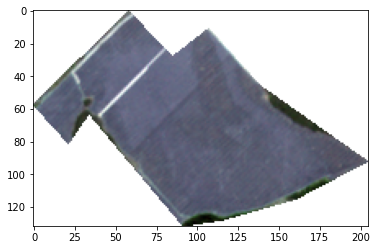

In [60]:
img = cv2.imread(img_path_png, cv2.COLOR_BGR2RGB)
plt.imshow(img, cmap="gray")

### Imagem renderizada com os valores de ndvi

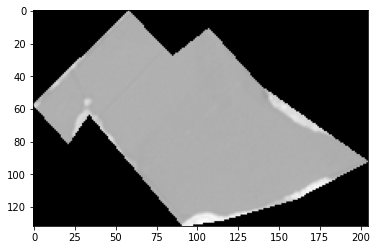

In [61]:
part = ndvi.copy()[0]
part[part < -1] = -1
plt.imshow(part, cmap="gray")

In [62]:
img = cv2.imread(img_path_png, cv2.COLOR_BGR2RGB)
print(img.shape)
print(ndvi.shape)

(132, 205, 3)
(1, 132, 205)


### Recorte da imagem RGB com uma possível mancha de subdesenvolvimento

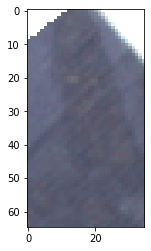

In [63]:
part = img[15:80, 90:125]
plt.imshow(part, cmap="gray")

### Recorte da imagem NDVI com uma possível mancha de subdesenvolvimento

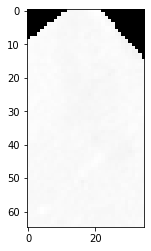

In [64]:
part = ndvi.copy()[0][15:80, 90:125]
part[part < -1] = -1
plt.imshow(part, cmap="gray")

In [65]:
part[10:50][10:15]

array([[0.20437956, 0.2004473 , 0.19944212, 0.20521353, 0.1998894 ,
        0.19865696, 0.20506184, 0.20453191, 0.19515151, 0.19356833,
        0.19140872, 0.18773946, 0.18466899, 0.18230648, 0.17854849,
        0.17858309, 0.18762344, 0.19033432, 0.19235836, 0.18800913,
        0.1943625 , 0.18889269, 0.18350515, 0.18112834, 0.18038076,
        0.18907036, 0.19402985, 0.1918958 , 0.19895288, 0.20417634,
        0.19534884, 0.19485079, 0.19264968, 0.18694724, 0.18779491],
       [0.20325203, 0.20033717, 0.19776224, 0.20222223, 0.20703125,
        0.20158327, 0.19520548, 0.20092915, 0.20609756, 0.2       ,
        0.1885786 , 0.18158403, 0.17793368, 0.17680429, 0.1757925 ,
        0.17785785, 0.18712674, 0.18714806, 0.1824435 , 0.17533718,
        0.17291255, 0.17533585, 0.17981714, 0.18504065, 0.18484947,
        0.18732171, 0.19280359, 0.19767442, 0.20093732, 0.19507186,
        0.1942319 , 0.19822222, 0.19539534, 0.19361901, 0.18945312],
       [0.20189627, 0.19844358, 0.19731319, 0.

## Criando classificação para o NDVI



*   NDVI < -1 = Fundo da imagem = BRANCO
*   NDVI <= 0 = Objetos Inanimados = PRETO
*   NDVI < 0.33 = Plantas não saudáveis = VERMELHO
*   NDVI < 0.75 = Plantas moderadamento saudáveis = LARANJA
*   NDVI < 1 = Plantas saudáveis = VERDE







In [66]:
def generate_ndvi_colored(ndvi_path, rgb_path):
  img = cv2.imread(rgb_path, cv2.COLOR_BGR2RGB)
  dataset = rasterio.open(ndvi_path)
  ndvi = dataset.read()
  for idx_line, line in enumerate(img):
    for pixel_idx, pixel in enumerate(line):
      ndvi_value = ndvi[0][idx_line][pixel_idx]
      # Fundo
      if(ndvi_value < -1):
        img[idx_line][pixel_idx] = [255, 255, 255]
      # Objetos Inanimados
      elif(ndvi_value <= 0):
        img[idx_line][pixel_idx] = [0, 0, 0]
      # Plantas não saudáveis
      elif(ndvi_value <= 0.33):
        img[idx_line][pixel_idx] = [255, 0, 0]
      # Plantas moderadamente saudáveis
      elif(ndvi_value <= 0.75):
        img[idx_line][pixel_idx] = [255, 150, 51]
      # Saudáveis
      else:
        img[idx_line][pixel_idx] = [0, 255, 0]
  return img

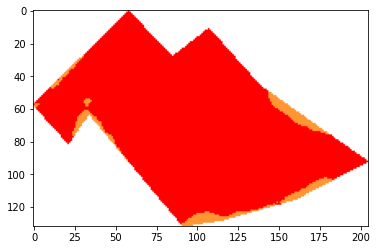

In [67]:
img = generate_ndvi_colored(img_path_ndvi, img_path_png)
plt.imshow(img, cmap="gray")

# Calculando área em pixels dado um limite inferior e superior

In [68]:
def get_total_area_by_threshold(threshold_min, threshold_max, ndvi):
  ndvi_c = ndvi.copy()[0]
  mask = np.zeros((ndvi_c.shape[0], ndvi_c.shape[1], 3))
  cont_area = 0
  for l, line in enumerate(ndvi_c):
    for c, pixel in enumerate(line):
      if(pixel > threshold_min and pixel <= threshold_max):
        mask[l][c] = [0,0,0]
        cont_area += 1
      else:
        mask[l][c] = [255,255,255]
  return (mask, cont_area)

## Área Total

In [69]:
img, area = get_total_area_by_threshold(-1, 1, ndvi)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


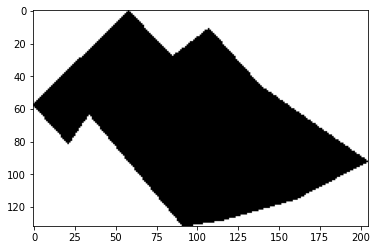

In [70]:
plt.imshow(img, cmap="gray")

In [71]:
print('A área total é {} pixels quadrados'.format(area))

A área total é 13417 pixels quadrados


## Objetos inanimados


In [72]:
img, area = get_total_area_by_threshold(-1, 0, ndvi)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


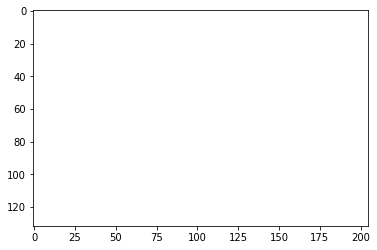

In [73]:
plt.imshow(img, cmap="gray")

In [74]:
print('A área total é {} pixels quadrados'.format(area))

A área total é 0 pixels quadrados


## Plantas não saudáveis

In [75]:
img, area = get_total_area_by_threshold(0, 0.33, ndvi)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


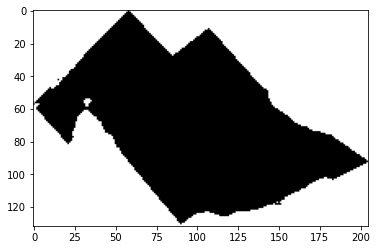

In [76]:
plt.imshow(img, cmap="gray")

In [77]:
print('A área total é {} pixels quadrados'.format(area))

A área total é 12698 pixels quadrados


## Plantas moderadamente saudáveis

In [78]:
img, area = get_total_area_by_threshold(0.33, 0.75, ndvi)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


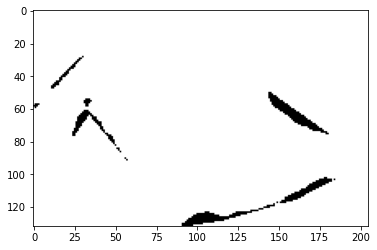

In [79]:
plt.imshow(img, cmap="gray")

In [80]:
print('A área total é {} pixels quadrados'.format(area))

A área total é 719 pixels quadrados


## Plantas saudáveis

In [81]:
img, area = get_total_area_by_threshold(0.75, 1, ndvi)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


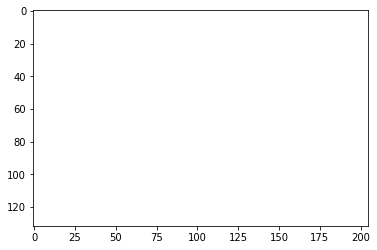

In [82]:
plt.imshow(img, cmap="gray")

In [83]:
print('A área total é {} pixels quadrados'.format(area))

A área total é 0 pixels quadrados


# Processando Dataset e criando features baseadas na classificação NDVI

In [84]:
import pandas as pd
from rasterio import RasterioIOError

In [85]:
def calc_areas(ndvi_path, rgb_path):
  try:
    data = rasterio.open(ndvi_path)
    ndvi = data.read()
    img = cv2.imread(rgb_path, cv2.COLOR_BGR2RGB)
    img1, total_area = get_total_area_by_threshold(-1, 1, ndvi)
    img2, inanimados_area = get_total_area_by_threshold(-1, 0, ndvi)
    img3, plantas_nao_saudaveis_area = get_total_area_by_threshold(0, 0.33, ndvi)
    img4, plantas_moderadamente_saudaveis_area = get_total_area_by_threshold(0.33, 0.75, ndvi)
    img5, plantas_saudaveis_area = get_total_area_by_threshold(0.75, 1, ndvi)
    return ((img1, total_area), 
            (img2, inanimados_area), 
            (img3, plantas_nao_saudaveis_area), 
            (img4, plantas_moderadamente_saudaveis_area), 
            (img5, plantas_saudaveis_area))
  except RasterioIOError:
    return ((pd.NA, pd.NA), 
          (pd.NA, pd.NA), 
          (pd.NA, pd.NA), 
          (pd.NA, pd.NA), 
          (pd.NA, pd.NA))

In [86]:
def calc_ndvi_summary(ndvi_path):
  try:
    data = rasterio.open(ndvi_path)
    ndvi = data.read()
    ndvi = ndvi[ndvi > -1]
    return (ndvi.mean(), np.median(ndvi), np.min(ndvi), np.max(ndvi))
  except RasterioIOError:
    return (pd.NA, pd.NA, pd.NA, pd.NA)

In [87]:
df = pd.read_csv('desafio_bemagro/{}/{}'.format(bemagro_dataset, bemagro_dataset_csv))
df.head()

,temp ano,temp mes,Data,Nublado,Cultura,RGB,NDVI
0,2016,3,2016-03-30,"0,00%",algodao,RGB/2016-03-30.tif,NDVI/2016-03-30.tif
1,2016,4,2016-04-29,"0,00%",algodao,RGB/2016-04-29.tif,NDVI/2016-04-29.tif
2,2016,7,2016-07-18,"0,00%",algodao,RGB/2016-07-18.tif,NDVI/2016-07-18.tif
3,2016,8,2016-08-07,"0,00%",colheita,RGB/2016-08-07.tif,NDVI/2016-08-07.tif
4,2016,9,2016-09-16,"0,89%",soja,RGB/2016-09-16.tif,NDVI/2016-09-16.tif


In [88]:
total_area = []
inanimados_area = []
plantas_nao_saudaveis_area = []
plantas_moderadamente_saudaveis_area = []
plantas_saudaveis_area = []
ndvi_mean = []
ndvi_median = []
ndvi_min = []
ndvi_max = []

for index, row in df.iterrows():
  base_path = 'desafio_bemagro/{}/'.format(bemagro_dataset)
  rgb_path = base_path + row['RGB'].replace('RGB', 'JPEG').replace('.tif', '.png')
  ndvi_path = base_path + row['NDVI']
  (_, ta), (_, ia), (_, pnsa), (_, pmsa), (_, psa) = calc_areas(ndvi_path, rgb_path)
  total_area.append(ta)
  inanimados_area.append(ia)
  plantas_nao_saudaveis_area.append(pnsa)
  plantas_moderadamente_saudaveis_area.append(pmsa)
  plantas_saudaveis_area.append(psa)

  mean, median, min, max = calc_ndvi_summary(ndvi_path)
  ndvi_mean.append(mean)
  ndvi_median.append(median)
  ndvi_min.append(min)
  ndvi_max.append(max)

df['total_area'] = total_area
df['inanimados_area'] = inanimados_area
df['plantas_nao_saudaveis_area'] = plantas_nao_saudaveis_area
df['plantas_moderadamente_saudaveis_area'] = plantas_moderadamente_saudaveis_area
df['plantas_saudaveis_area'] = plantas_saudaveis_area
df['ndvi_mean'] = ndvi_mean
df['ndvi_median'] = ndvi_median
df['ndvi_min'] = ndvi_min
df['ndvi_max'] = ndvi_max

In [89]:
df.head()

,temp ano,temp mes,Data,Nublado,Cultura,RGB,NDVI,total_area,inanimados_area,plantas_nao_saudaveis_area,plantas_moderadamente_saudaveis_area,plantas_saudaveis_area,ndvi_mean,ndvi_median,ndvi_min,ndvi_max
0,2016,3,2016-03-30,"0,00%",algodao,RGB/2016-03-30.tif,NDVI/2016-03-30.tif,13417,0,27,13154,236,0.652147,0.665605,0.217831,0.81405
1,2016,4,2016-04-29,"0,00%",algodao,RGB/2016-04-29.tif,NDVI/2016-04-29.tif,13417,0,3,2443,10971,0.766871,0.782663,0.232097,0.842139
2,2016,7,2016-07-18,"0,00%",algodao,RGB/2016-07-18.tif,NDVI/2016-07-18.tif,13417,0,12698,719,0,0.212399,0.196501,0.068794,0.742227
3,2016,8,2016-08-07,"0,00%",colheita,RGB/2016-08-07.tif,NDVI/2016-08-07.tif,13417,0,12931,486,0,0.188343,0.177599,0.069947,0.701362
4,2016,9,2016-09-16,"0,89%",soja,RGB/2016-09-16.tif,NDVI/2016-09-16.tif,13417,0,12859,558,0,0.158188,0.142414,0.096948,0.545478


## Detectando ciclo de cultura


In [90]:
plantacoes = []
index_to_cut = 0
for index, row in df.iterrows():
  if(row['Cultura'] == 'colheita'):
    plantacoes.append(df.iloc[index_to_cut:index+1])
    index_to_cut = index+1

print(len(plantacoes))
plantacoes[0].head()



11


,temp ano,temp mes,Data,Nublado,Cultura,RGB,NDVI,total_area,inanimados_area,plantas_nao_saudaveis_area,plantas_moderadamente_saudaveis_area,plantas_saudaveis_area,ndvi_mean,ndvi_median,ndvi_min,ndvi_max
0,2016,3,2016-03-30,"0,00%",algodao,RGB/2016-03-30.tif,NDVI/2016-03-30.tif,13417,0,27,13154,236,0.652147,0.665605,0.217831,0.81405
1,2016,4,2016-04-29,"0,00%",algodao,RGB/2016-04-29.tif,NDVI/2016-04-29.tif,13417,0,3,2443,10971,0.766871,0.782663,0.232097,0.842139
2,2016,7,2016-07-18,"0,00%",algodao,RGB/2016-07-18.tif,NDVI/2016-07-18.tif,13417,0,12698,719,0,0.212399,0.196501,0.068794,0.742227
3,2016,8,2016-08-07,"0,00%",colheita,RGB/2016-08-07.tif,NDVI/2016-08-07.tif,13417,0,12931,486,0,0.188343,0.177599,0.069947,0.701362


# Plotando imagens de cada ciclo de plantação

## Imagens RGB

In [91]:
culturas = df['Cultura'].unique()

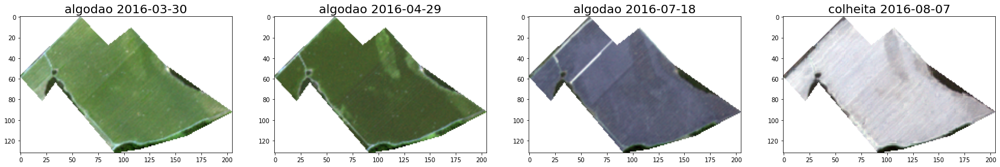

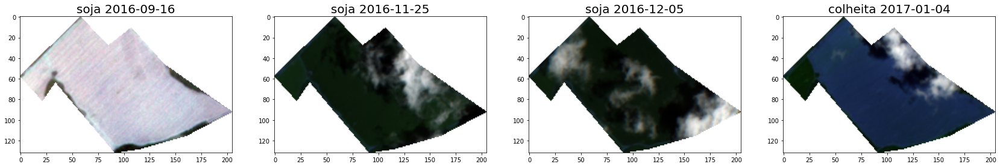

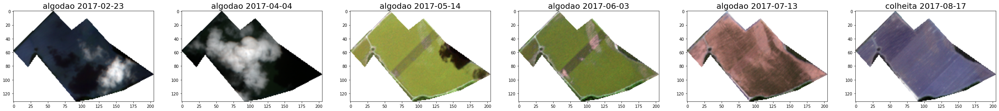

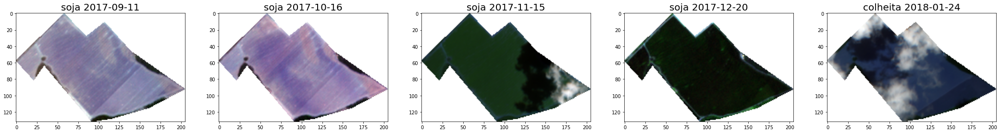

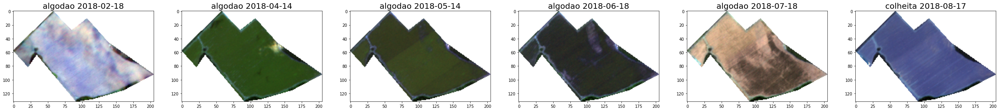

...

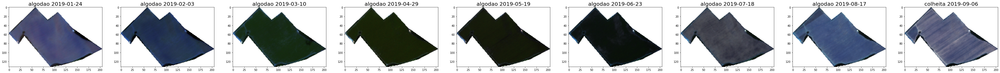

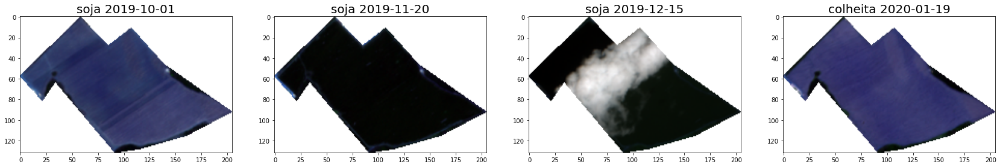

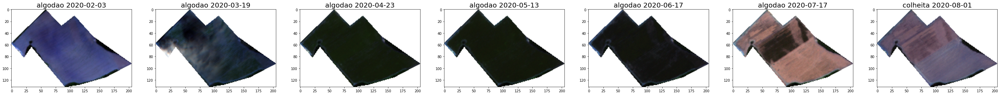

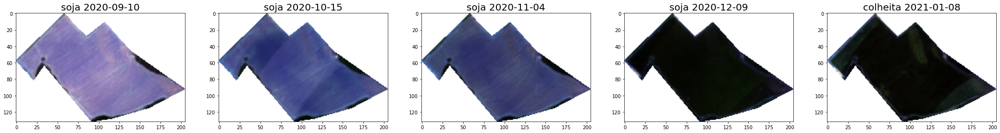

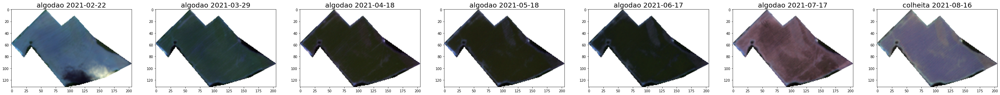

In [92]:
for cultura in plantacoes:
  i = 0
  plt.figure(figsize=(150, 80))
  for index, row in cultura.iterrows():
    base_path = 'desafio_bemagro/{}/'.format(bemagro_dataset)
    rgb_path = base_path + row['RGB'].replace('RGB', 'JPEG').replace('.tif', '.png')
    img_rgb = cv2.imread(rgb_path, cv2.COLOR_BGR2RGB)
    if(img_rgb is not None):
      i += 1
      plt.subplot(3, 20, i)
      plt.title(label = "{} {}".format(row['Cultura'], row['Data']), fontsize=20)
      plt.imshow(img_rgb)
  plt.show()


## Imagens NDVI

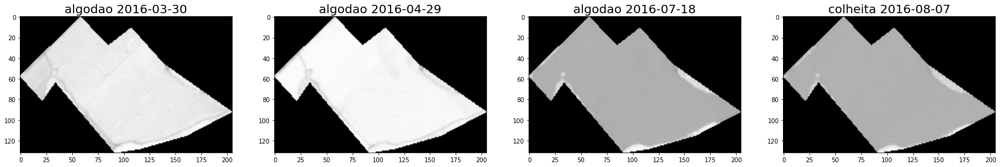

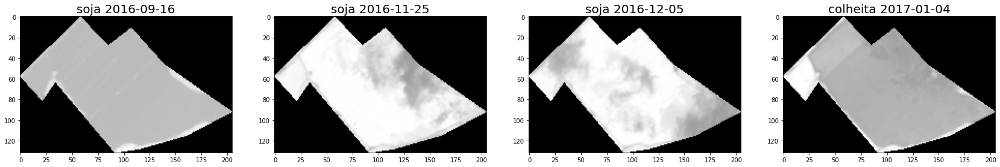

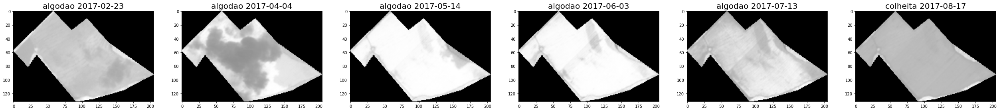

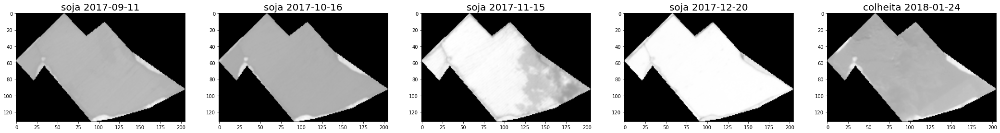

IMG não encontrada


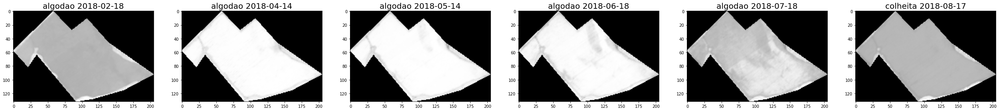

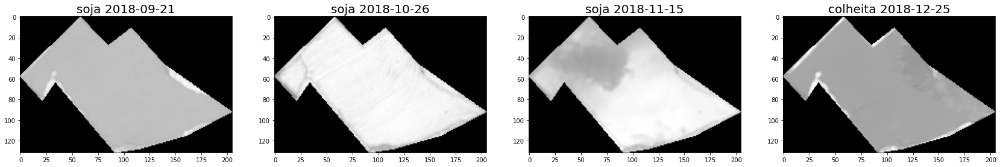

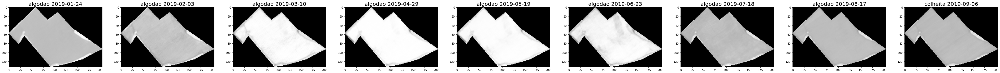

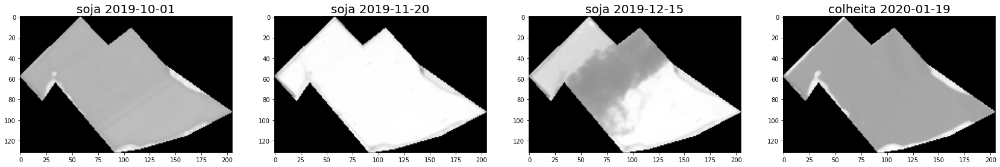

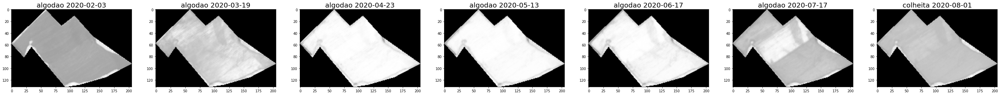

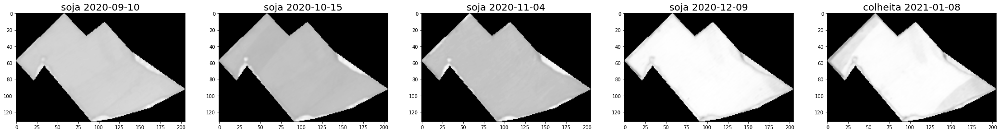

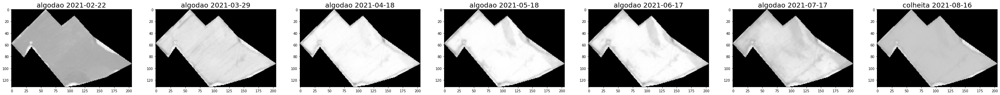

In [93]:
for cultura in plantacoes:
  i = 0
  plt.figure(figsize=(150, 80))
  for index, row in cultura.iterrows():
    try:
      base_path = 'desafio_bemagro/{}/'.format(bemagro_dataset)
      img_path_ndvi = base_path + row['NDVI']
      dataset = rasterio.open(img_path_ndvi)
      ndvi = dataset.read()
      ndvi = ndvi[0]
      ndvi[ndvi < -1] = -1
      i += 1
      plt.subplot(3, 20, i)
      plt.title(label = "{} {}".format(row['Cultura'], row['Data']), fontsize=20)
      plt.imshow(ndvi, cmap="gray")
    except RasterioIOError:
      print('IMG não encontrada')
  plt.show()


## Imagens com áreas de plantas de saúde moderada

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


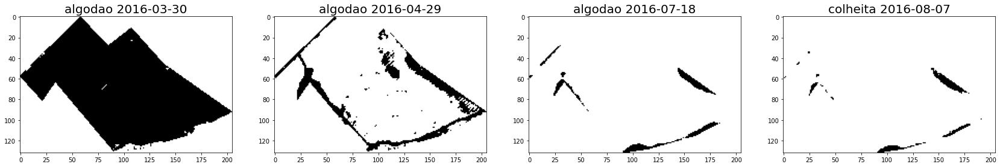

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


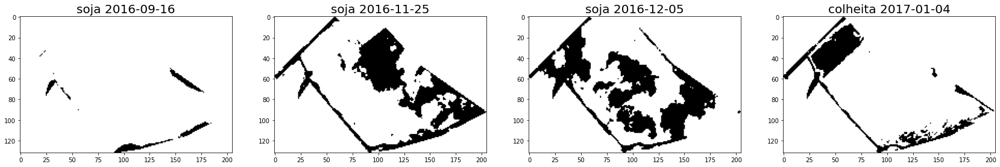

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


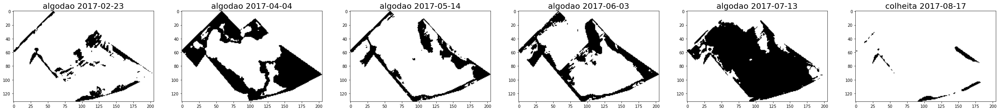

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


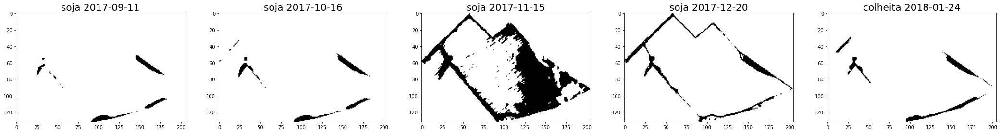

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


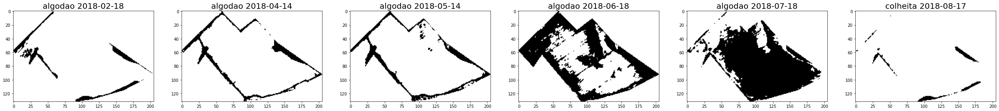

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


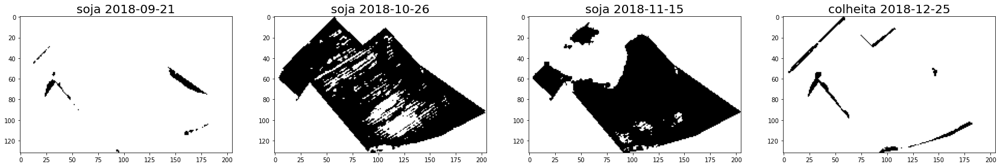

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


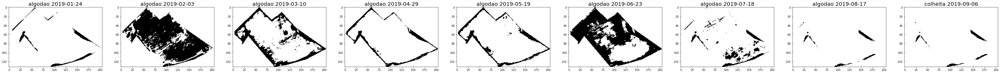

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


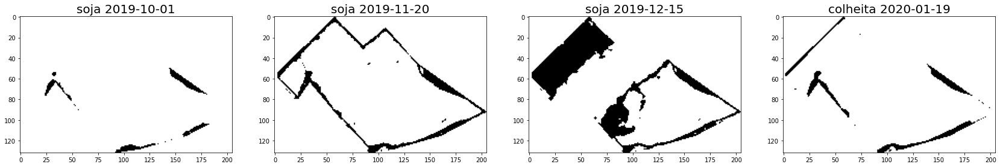

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


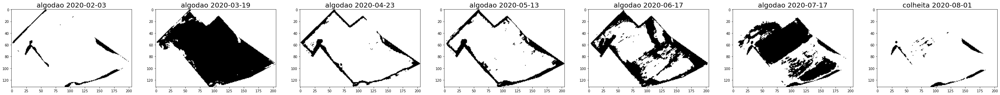

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


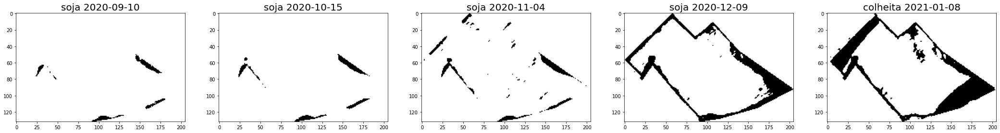

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


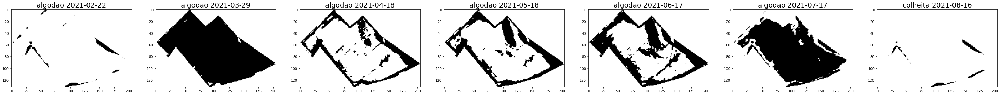

In [94]:
for cultura in plantacoes:
  i = 0
  plt.figure(figsize=(150, 80))
  for index, row in cultura.iterrows():
    base_path = 'desafio_bemagro/{}/'.format(bemagro_dataset)
    rgb_path = base_path + row['RGB'].replace('RGB', 'JPEG').replace('.tif', '.png')
    ndvi_path = base_path + row['NDVI']
    (img_area_total, _), (_, _), (img_nao_saudavel, _), (img_moderadamente_saudavel, _), (_, _) = calc_areas(ndvi_path, rgb_path)
    if(img_moderadamente_saudavel is not pd.NA):
      i += 1
      plt.subplot(3, 20, i)
      plt.title(label = "{} {}".format(row['Cultura'], row['Data']), fontsize=20)
      plt.imshow(img_moderadamente_saudavel, cmap="gray")
  plt.show()
    

## Imagens coloridas de acordo com a classificação NDVI



*   NDVI < -1 = Fundo da imagem = BRANCO
*   NDVI <= 0 = Objetos Inanimados = PRETO
*   NDVI < 0.33 = Plantas não saudáveis = VERMELHO
*   NDVI < 0.75 = Plantas moderadamento saudáveis = LARANJA
*   NDVI < 1 = Plantas saudáveis = VERDE







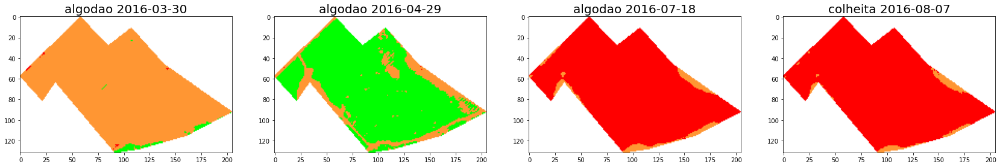

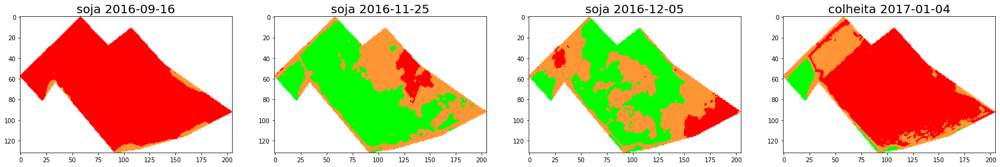

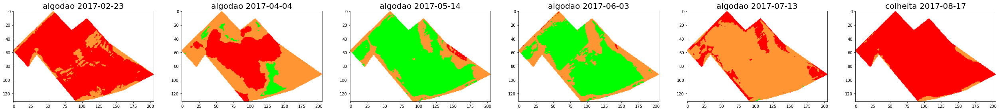

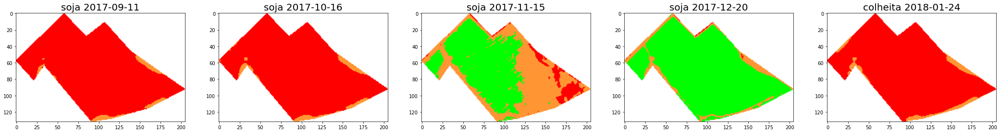

não foi encontrada a img: desafio_bemagro/dataset_1/NDVI/2018-03-20.tif


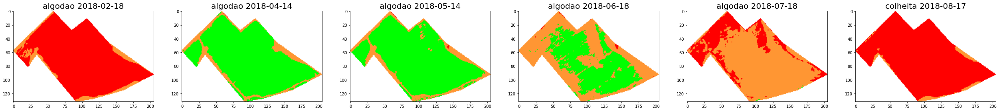

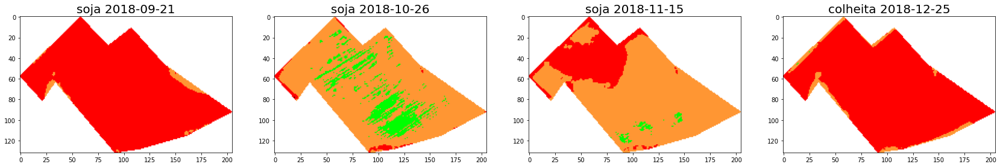

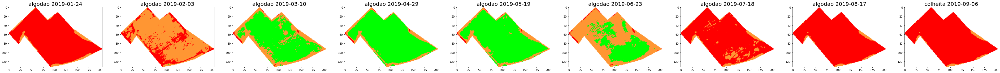

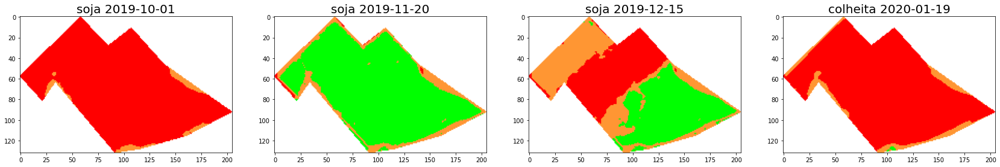

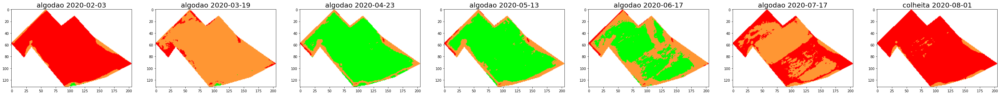

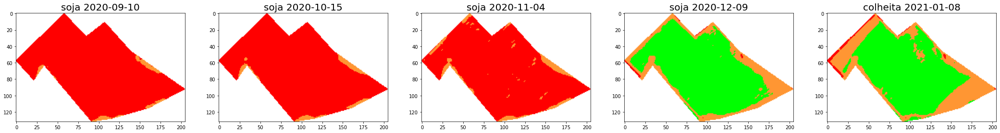

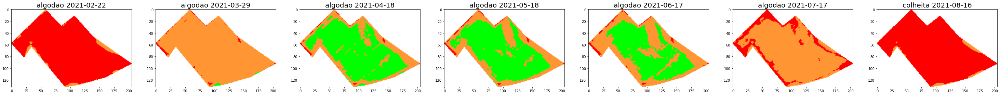

In [95]:
for cultura in plantacoes:
  i = 0
  plt.figure(figsize=(150, 80))
  for index, row in cultura.iterrows():
    try:
      base_path = 'desafio_bemagro/{}/'.format(bemagro_dataset)
      rgb_path = base_path + row['RGB'].replace('RGB', 'JPEG').replace('.tif', '.png')
      ndvi_path = base_path + row['NDVI']
      img = generate_ndvi_colored(ndvi_path, rgb_path)
      i += 1
      plt.subplot(3, 20, i)
      plt.title(label = "{} {}".format(row['Cultura'], row['Data']), fontsize=20)
      plt.imshow(img, cmap="gray")
    except:
      print('não foi encontrada a img: {}'.format(ndvi_path))
  plt.show()

## Verificando ndvi por plantios

In [96]:
plantacoes[0]

,temp ano,temp mes,Data,Nublado,Cultura,RGB,NDVI,total_area,inanimados_area,plantas_nao_saudaveis_area,plantas_moderadamente_saudaveis_area,plantas_saudaveis_area,ndvi_mean,ndvi_median,ndvi_min,ndvi_max
0,2016,3,2016-03-30,"0,00%",algodao,RGB/2016-03-30.tif,NDVI/2016-03-30.tif,13417,0,27,13154,236,0.652147,0.665605,0.217831,0.81405
1,2016,4,2016-04-29,"0,00%",algodao,RGB/2016-04-29.tif,NDVI/2016-04-29.tif,13417,0,3,2443,10971,0.766871,0.782663,0.232097,0.842139
2,2016,7,2016-07-18,"0,00%",algodao,RGB/2016-07-18.tif,NDVI/2016-07-18.tif,13417,0,12698,719,0,0.212399,0.196501,0.068794,0.742227
3,2016,8,2016-08-07,"0,00%",colheita,RGB/2016-08-07.tif,NDVI/2016-08-07.tif,13417,0,12931,486,0,0.188343,0.177599,0.069947,0.701362


In [97]:
plantacoes[2]

,temp ano,temp mes,Data,Nublado,Cultura,RGB,NDVI,total_area,inanimados_area,plantas_nao_saudaveis_area,plantas_moderadamente_saudaveis_area,plantas_saudaveis_area,ndvi_mean,ndvi_median,ndvi_min,ndvi_max
8,2017,2,2017-02-23,"13,08%",algodao,RGB/2017-02-23.tif,NDVI/2017-02-23.tif,13417,0,11270,2147,0,0.2853,0.281431,0.101028,0.640738
9,2017,4,2017-04-04,"56,00%",algodao,RGB/2017-04-04.tif,NDVI/2017-04-04.tif,13417,0,5417,7155,845,0.411087,0.442037,0.016755,0.814571
10,2017,5,2017-05-14,"0,00%",algodao,RGB/2017-05-14.tif,NDVI/2017-05-14.tif,13417,0,178,3373,9866,0.761043,0.806016,0.143106,0.836742
11,2017,6,2017-06-03,"0,00%",algodao,RGB/2017-06-03.tif,NDVI/2017-06-03.tif,13417,0,37,4564,8816,0.739732,0.783665,0.150552,0.826237
12,2017,7,2017-07-13,"0,00%",algodao,RGB/2017-07-13.tif,NDVI/2017-07-13.tif,13417,0,2323,11085,9,0.473736,0.483491,0.082103,0.775922
13,2017,8,2017-08-17,"0,00%",colheita,RGB/2017-08-17.tif,NDVI/2017-08-17.tif,13417,0,12863,554,0,0.242873,0.238325,0.061667,0.697475


In [98]:
plantacoes[4]

,temp ano,temp mes,Data,Nublado,Cultura,RGB,NDVI,total_area,inanimados_area,plantas_nao_saudaveis_area,plantas_moderadamente_saudaveis_area,plantas_saudaveis_area,ndvi_mean,ndvi_median,ndvi_min,ndvi_max
19,2018,2,2018-02-18,"0,00%",algodao,RGB/2018-02-18.tif,NDVI/2018-02-18.tif,13417,0,12144,1273,0,0.265431,0.24114,0.110764,0.748342
20,2018,3,2018-03-20,"0,00%",algodao,RGB/2018-03-20.tif,NDVI/2018-03-20.tif,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>
21,2018,4,2018-04-14,"0,00%",algodao,RGB/2018-04-14.tif,NDVI/2018-04-14.tif,13417,0,7,1847,11563,0.816921,0.844597,0.203494,0.866138
22,2018,5,2018-05-14,"0,00%",algodao,RGB/2018-05-14.tif,NDVI/2018-05-14.tif,13417,0,20,2157,11240,0.800444,0.832867,0.154798,0.851411
23,2018,6,2018-06-18,"0,00%",algodao,RGB/2018-06-18.tif,NDVI/2018-06-18.tif,13417,0,44,7112,6261,0.709316,0.746339,0.125772,0.789866
24,2018,7,2018-07-18,"0,00%",algodao,RGB/2018-07-18.tif,NDVI/2018-07-18.tif,13417,0,3316,10091,10,0.434464,0.408678,0.079721,0.770063
25,2018,8,2018-08-17,"0,03%",colheita,RGB/2018-08-17.tif,NDVI/2018-08-17.tif,13417,0,12823,594,0,0.236554,0.230701,0.026208,0.713037


In [99]:
plantacoes[6]

,temp ano,temp mes,Data,Nublado,Cultura,RGB,NDVI,total_area,inanimados_area,plantas_nao_saudaveis_area,plantas_moderadamente_saudaveis_area,plantas_saudaveis_area,ndvi_mean,ndvi_median,ndvi_min,ndvi_max
30,2019,1,2019-01-24,"0,11%",algodao,RGB/2019-01-24.tif,NDVI/2019-01-24.tif,13417,0,12444,973,0,0.237416,0.217679,0.074259,0.63475
31,2019,2,2019-02-03,"0,08%",algodao,RGB/2019-02-03.tif,NDVI/2019-02-03.tif,13417,1,3033,10380,3,0.361558,0.357234,-0.00576,0.765034
32,2019,3,2019-03-10,"0,08%",algodao,RGB/2019-03-10.tif,NDVI/2019-03-10.tif,13417,0,135,4095,9187,0.740359,0.779583,0.032474,0.82312
33,2019,4,2019-04-29,"0,02%",algodao,RGB/2019-04-29.tif,NDVI/2019-04-29.tif,13417,0,103,1788,11526,0.801305,0.83433,0.023218,0.846311
34,2019,5,2019-05-19,"0,00%",algodao,RGB/2019-05-19.tif,NDVI/2019-05-19.tif,13417,0,110,2128,11179,0.784125,0.815668,0.030585,0.845895
35,2019,6,2019-06-23,"0,05%",algodao,RGB/2019-06-23.tif,NDVI/2019-06-23.tif,13417,0,226,8538,4653,0.689621,0.728545,0.030234,0.814404
36,2019,7,2019-07-18,"0,05%",algodao,RGB/2019-07-18.tif,NDVI/2019-07-18.tif,13417,1,11735,1681,0,0.297156,0.290354,0.0,0.74778
37,2019,8,2019-08-17,"0,05%",algodao,RGB/2019-08-17.tif,NDVI/2019-08-17.tif,13417,0,12907,510,0,0.226295,0.222333,0.004408,0.653714
38,2019,9,2019-09-06,"3,00%",colheita,RGB/2019-09-06.tif,NDVI/2019-09-06.tif,13417,0,12918,499,0,0.211798,0.206323,0.018575,0.649839


## Detectando áreas de subdesenvolvimento recorrente por plantação

In [100]:
def detecta_subdesenvlimento_por_plantacao(cultura):
  imgs = []
  pixels_subdesenvolvimento = []
  for index, row in cultura.iterrows():
    try:
      base_path = 'desafio_bemagro/{}/'.format(bemagro_dataset)
      ndvi_path = base_path + row['NDVI']
      dataset = rasterio.open(ndvi_path)
      ndvi = dataset.read()
      imgs.append(ndvi[0])
    except:
      print('não foi encontrada a img: {}'.format(ndvi_path))
  for l, line in enumerate(imgs[0]):
    for c, ndvi_value in enumerate(line):
      if(ndvi_value >= -1 and ndvi_value < 0.75):
        eh_subdesenvolvido = True
        for img in imgs:
          if img[l][c] >= 0.75:
            eh_subdesenvolvido = False
            break
        if(eh_subdesenvolvido == True):
          pixels_subdesenvolvimento.append((l,c))
  regiao_subdesenvlvimento = np.zeros((imgs[0].shape[0],imgs[0].shape[1])) + 255
  for l, c in pixels_subdesenvolvimento:
    regiao_subdesenvlvimento[l][c] = 0
  return regiao_subdesenvlvimento
        


não foi encontrada a img: desafio_bemagro/dataset_1/NDVI/2018-03-20.tif


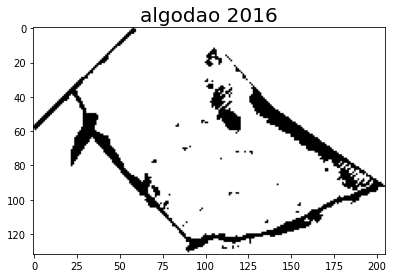

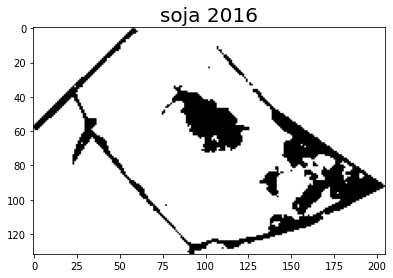

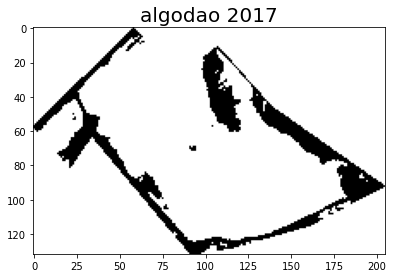

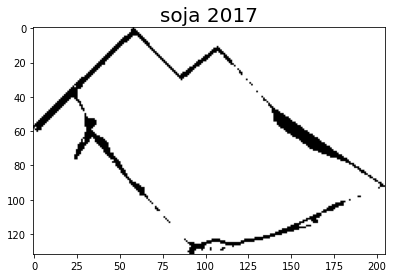

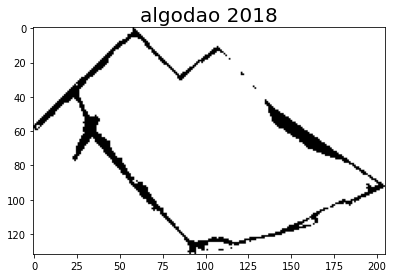

...

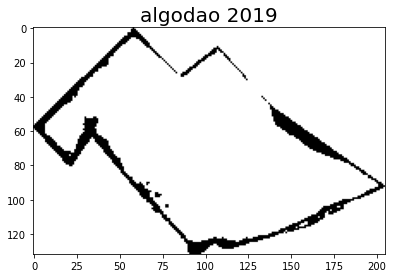

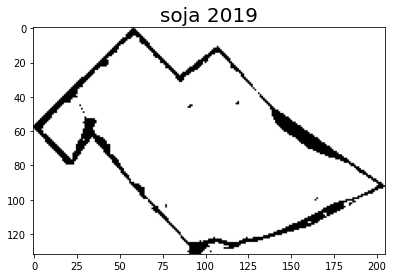

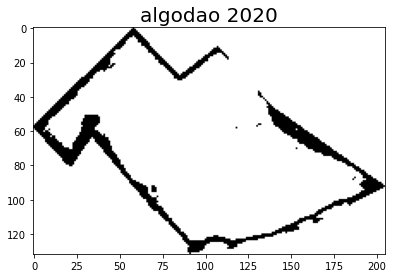

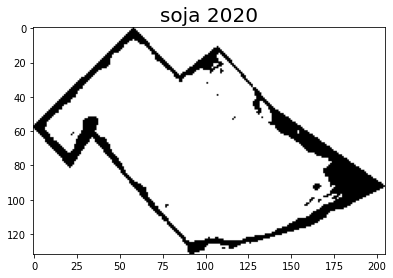

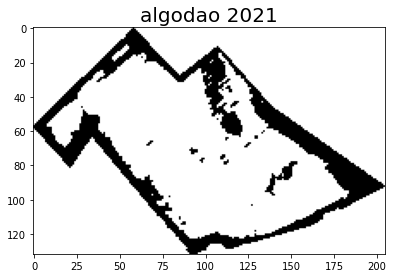

In [101]:
for index, cultura in enumerate(plantacoes):
  plt.figure(figsize=(150, 80))
  regiao_subdesenvlvimento = detecta_subdesenvlimento_por_plantacao(cultura)
  plt.subplot(3, 20, index + 1)
  row = cultura.iloc[0]
  plt.title(label = "{} {}".format(row['Cultura'], row['temp ano']), fontsize=20)
  plt.imshow(regiao_subdesenvlvimento, cmap="gray")